## Business Objective
The business objective is to leverage clustering, recommender systems, and natural language processing (NLP) methods to enhance yelp operations, customer experience, and decision-making. Clustering method can help identify distinct customer segments with common interests, allowing businesses to tailor marketing strategies and offerings to different groups. Implement recommender systems to suggest relevant businesses, services, or products to users based on their past reviews and preferences. This enhances the user experience and encourages continued engagement with the Yelp platform. Use NLP to analyze the sentiment of reviews, providing insights into customer satisfaction or dissatisfaction. Businesses can identify areas for improvement and address specific issues raised by customers. 
  
## Technical Objective
- K-Means Clustering:
  > Create Inertia model using 10,000 sample data
- Hierarchal Clustering:
  > Create a dendrogram and hierarchal cluster analysis with method 'complete' and 'ward'
  
  > Compare the clustering results of each of the different predicted clusters and apply clusters for full-data
- Recommender System using PCA
- Recommender System using SVD
- Natural Language Processing for 4-star reviews and 2-star reviews:
  > Find Top 15 business categories among all restaurants and select one business category for further analysis
  
  > Create text strings and WordCloud for text for stars >= 4 and stars <= 2
  
  > Create tri-grams for 4-star and 2-star reviews

##  1. Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score, silhouette_samples, confusion_matrix, classification_report, roc_curve
from scipy.cluster.hierarchy import linkage, dendrogram

import matplotlib as mpl
from matplotlib.ticker import FixedLocator, FixedFormatter

from scipy.cluster.hierarchy import fcluster

import nltk
from collections import Counter
from nltk.corpus import stopwords

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

## 2. Import Data & Data Reconstruction

In [2]:
# Import All datasets 
df_rest = pd.read_csv('data/Restaurants.csv', index_col = 0, header=0)
df_user = pd.read_csv('data/Full_User.csv', index_col = 0, header=0)
df_quebec_review = pd.read_csv('data/Alberta_Quebec_Reviews.csv', index_col = 0, header=0)
df_ontario_reviews = pd.read_csv('data/Ontario_Reviews.csv', index_col = 0, header=0)
df_oh_reviews = pd.read_csv('data/OH_Reviews.csv', index_col = 0, header=0)
df_az_reviews = pd.read_csv('data/AZ_Reviews.csv', index_col = 0, header=0)

In [3]:
# Combine 4 review data as 1 dataframe and name it as df_review.
df_review = pd.concat([df_quebec_review, df_ontario_reviews, df_oh_reviews, df_az_reviews], axis=0)

# Drop ['name', 'useful', 'funny', 'cool'] columns in df_review table since these columns are also in df_user table.
# Rename 'stars' as 'user_reviews' in df_review table. We will use user_review column in Section 7.
df_review = df_review.drop(['name', 'useful', 'funny', 'cool'], axis=1)
df_review.rename(columns={'stars':'user_reviews'},inplace=True)

# Rename 'name' as 'user_name' in df_user table since it is different from the 'name' in 'Restaurants' data for future joins.
df_user.rename(columns={'name':'user_name'},inplace=True)
# Drop ['stars', 'review_count'] columns in df_user table since the two columns are also in Restaurants table.
df_user = df_user.drop(['review_count'], axis=1)

# Combine df_user table and df_review table by joining on user_id to aviod missing data.
df_user_review = pd.merge(df_user, df_review, how = 'inner', on = 'user_id')

# Combine All data into one:
# Use inner join to remove NAs - make sure no NULLs for text column in df_all data
df_all = pd.merge(df_rest, df_user_review, how = 'inner', on = 'business_id')
df_all.head(3)
# df_all.to_csv('df_all.csv')

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,review_id,user_reviews,text,date
0,eBEfgOPG7pvFhb2wcG9I7w,Philthy Phillys,"15480 Bayview Avenue, unit D0110",Aurora,ON,L4G 7J1,44.010962,-79.448677,4.5,4,...,0,0,0,0,0,0,tZ5DuKIfUuuhxGYV7ywhvw,5.0,Excellent Excellent customer service!!\nWill d...,2019-10-11 19:59:57
1,eBEfgOPG7pvFhb2wcG9I7w,Philthy Phillys,"15480 Bayview Avenue, unit D0110",Aurora,ON,L4G 7J1,44.010962,-79.448677,4.5,4,...,0,0,0,0,0,0,gwU0Brt7bYIgFJeBhrmmmA,5.0,The cheese steak is great here. The guys cooki...,2019-01-26 14:59:53
2,eBEfgOPG7pvFhb2wcG9I7w,Philthy Phillys,"15480 Bayview Avenue, unit D0110",Aurora,ON,L4G 7J1,44.010962,-79.448677,4.5,4,...,0,0,0,0,0,0,wt8t7boUicBVutypSIFBfg,4.0,I've been here 4 times now and the Philly chee...,2019-11-16 17:02:55


## 3. K-Means Clustering
### 3a. Create Inertia model using sample data (10,000)

In [4]:
from random import sample
df_all_sample = df_all.sample(10000, random_state=8)

df_re_cluster = df_all_sample.select_dtypes(exclude = ['object'])

iteration 1 done
iteration 2 done
iteration 3 done
iteration 4 done
iteration 5 done
iteration 6 done
iteration 7 done
iteration 8 done
iteration 9 done


([<matplotlib.axis.XTick at 0x18f85389670>,
 [Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9')])

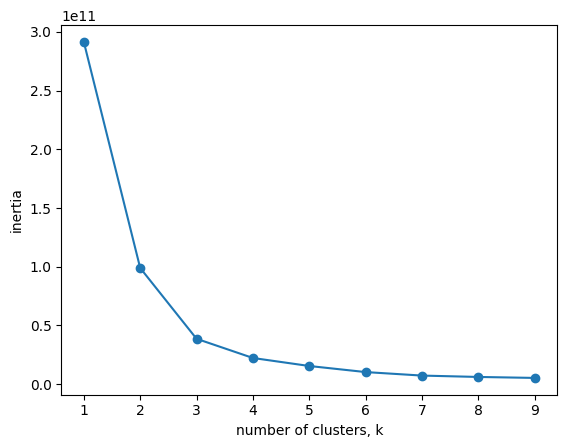

In [5]:
# Create an Inertia Model for df_re_cluster with a range from to 1 to 10
warnings.filterwarnings("ignore")

ks = range(1, 10)
inertias = []

for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(df_re_cluster)
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    print("iteration {} done".format(k))
    
# Plot ks vs inertias
plt.plot(ks, inertias, '-o')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)

### 3b. Create K-Means Clusters

In [6]:
# For n_clusters = 3
model_3 = KMeans(n_clusters = 3)
model_3.fit(df_re_cluster)

re_predict_k1 = model_3.predict(df_re_cluster)
re_predict_k1 = pd.DataFrame(re_predict_k1)
re_predict_k1 = re_predict_k1.rename(columns = {0:'Predict_k1'})
display(re_predict_k1.head())
re_predict_k1['Predict_k1'].value_counts()

,Predict_k1
0,0
1,0
2,0
3,0
4,0


Predict_k1
0    9948
2      48
1       4
Name: count, dtype: int64

In [7]:
# For n_clusters = 4
model_4 = KMeans(n_clusters = 4)
model_4.fit(df_re_cluster)

re_predict_k2 = model_4.predict(df_re_cluster)
re_predict_k2 = pd.DataFrame(re_predict_k2)
re_predict_k2 = re_predict_k2.rename(columns = {0:'Predict_k2'})
display(re_predict_k2.head())
re_predict_k2['Predict_k2'].value_counts()

,Predict_k2
0,0
1,0
2,0
3,0
4,0


Predict_k2
0    9899
2      85
3      12
1       4
Name: count, dtype: int64

### Section 3 Summary

According to the inertia model, the optimal number of groups for K-means clustering is either 3 or 4, so we decided to look at both numbers. For K=3 and K=4, there is one very large group (around 99%), with the rest of the groups being very small. This may indicate that there are outliers in the data, and they may need to be removed since they are not necessarily representative of the entire population.

## 4. Hierarchal Clustering
### 4a. Create a dendrogram and hierarchal cluster analysis with method = 'complete'

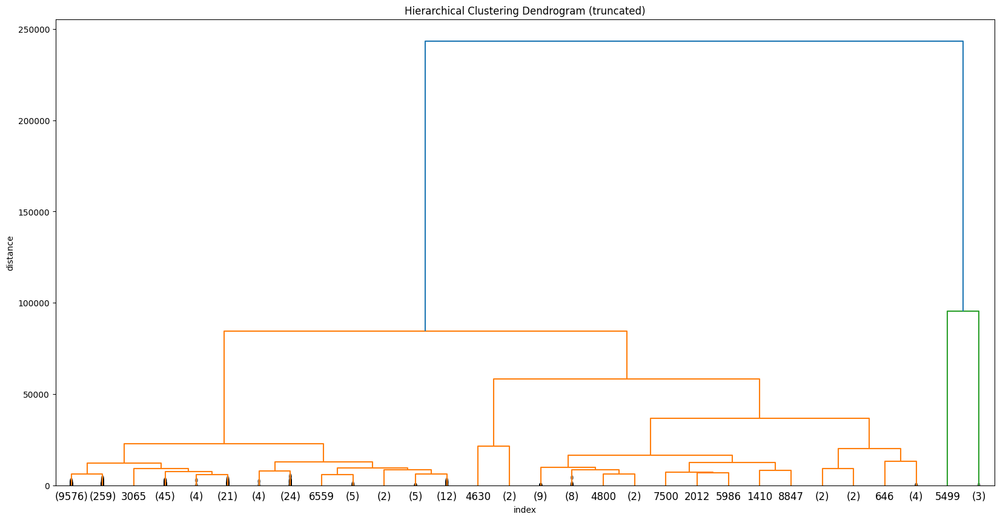

In [8]:
# Create a dendrogram for df_re_cluster with the method = 'complete'
mergings = linkage(df_re_cluster, method='complete')

# choose cutoff = 30
plt.figure(figsize=(20,10))
plt.title('Hierarchical Clustering Dendrogram (truncated)')
plt.xlabel('index')
plt.ylabel('distance')
dendrogram(
    mergings,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=30,  # show only the last p merged clusters
    show_leaf_counts=True,  # otherwise numbers in brackets are counts
    leaf_rotation=0.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
    orientation='top' #sets orientation to horizontal instead of vertical
)
plt.show()

In [9]:
# Create a DataFrame for the predictions. Name the DataFrame re_predict_hc and the name 
# of the column should be Predict_hc

#Show the value counts for each of the different predicted clusters for re_predict_hc['Predict_hc']

re_predict_hc = fcluster(mergings, 75000, criterion='distance')
re_predict_hc = pd.DataFrame(re_predict_hc)
re_predict_hc.columns = ['Predict_hc']
display(re_predict_hc.head())
re_predict_hc['Predict_hc'].value_counts()

,Predict_hc
0,1
1,1
2,1
3,1
4,1


Predict_hc
1    9959
2      37
3       3
4       1
Name: count, dtype: int64

### 4b. Create a dendrogram and hierarchal cluster analysis with method = 'ward'

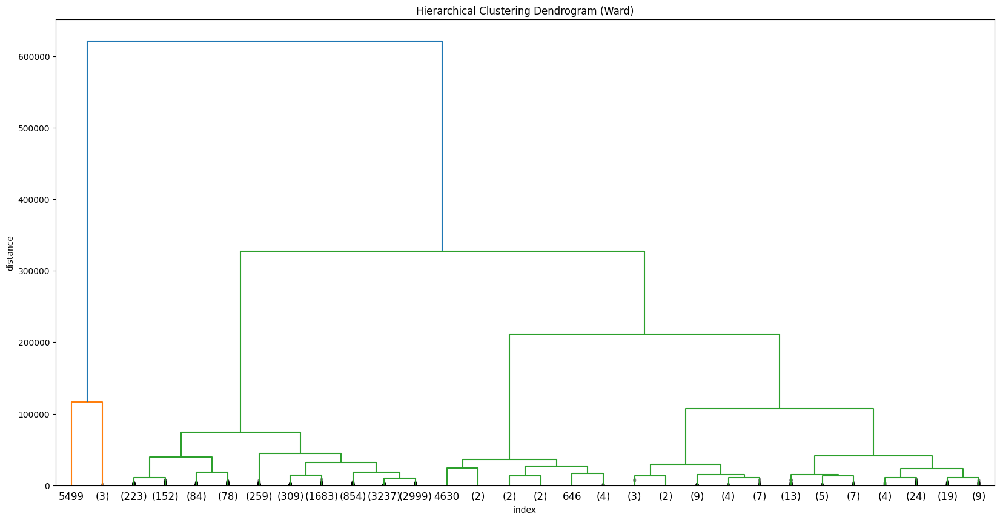

In [10]:
mergings_w = linkage(df_re_cluster, method='ward')

plt.figure(figsize=(20,10))
plt.title('Hierarchical Clustering Dendrogram (Ward)')
plt.xlabel('index')
plt.ylabel('distance')
dendrogram(
    mergings_w,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=30,  # show only the last p merged clusters
    show_leaf_counts=True,  # otherwise numbers in brackets are counts
    leaf_rotation=0.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
    orientation='top' #sets orientation to horizontal instead of vertical
)
plt.show()

In [11]:
re_predict_hw = fcluster(mergings_w, 150000, criterion='distance')
re_predict_hw = pd.DataFrame(re_predict_hw)
re_predict_hw.columns = ['Predict_hw']
display(re_predict_hw.head())
re_predict_hw['Predict_hw'].value_counts()

,Predict_hw
0,2
1,2
2,2
3,2
4,2


Predict_hw
2    9878
4     106
3      12
1       4
Name: count, dtype: int64

### 4c. Compare the results of each of the different predicted clusterss

Summary for section 3 & 4 - results explanation and analysis - well articulated, detailed and easy to understand





In [12]:
pd.crosstab(re_predict_k1['Predict_k1'], re_predict_k2['Predict_k2'])

Predict_k2,0,1,2,3
Predict_k1,,,,
0,9899,0,49,0
1,0,4,0,0
2,0,0,36,12


In [13]:
pd.crosstab(re_predict_hc['Predict_hc'], re_predict_hw['Predict_hw'])

Predict_hw,1,2,3,4
Predict_hc,,,,
1,0,9878,0,81
2,0,0,12,25
3,3,0,0,0
4,1,0,0,0


In [14]:
pd.crosstab(re_predict_k1['Predict_k1'], re_predict_hc['Predict_hc'])

Predict_hc,1,2,3,4
Predict_k1,,,,
0,9948,0,0,0
1,0,0,3,1
2,11,37,0,0


In [15]:
pd.crosstab(re_predict_k1['Predict_k1'], re_predict_hw['Predict_hw'])

Predict_hw,1,2,3,4
Predict_k1,,,,
0,0,9878,0,70
1,4,0,0,0
2,0,0,12,36


In [16]:
pd.crosstab(re_predict_k2['Predict_k2'], re_predict_hc['Predict_hc'])

Predict_hc,1,2,3,4
Predict_k2,,,,
0,9899,0,0,0
1,0,0,3,1
2,60,25,0,0
3,0,12,0,0


In [17]:
pd.crosstab(re_predict_k2['Predict_k2'], re_predict_hw['Predict_hw'])

Predict_hw,1,2,3,4
Predict_k2,,,,
0,0,9878,0,21
1,4,0,0,0
2,0,0,0,85
3,0,0,12,0


### 4c. KMeans - n_clusters = 4 for Full Dataset

In [18]:
# For n_clusters = 4
df_all_cluster = df_all.select_dtypes(exclude = ['object'])

model_4 = KMeans(n_clusters=4)
model_4.fit(df_all_cluster)
re_predict_4 = model_4.predict(df_all_cluster)
re_predict_k1 = pd.DataFrame(re_predict_4)
re_predict_k1 = re_predict_k1.rename(columns = {0:'Predict_k1'})
display(re_predict_k1.head())
re_predict_k1['Predict_k1'].value_counts()

,Predict_k1
0,0
1,0
2,0
3,0
4,0


Predict_k1
0    2842894
2      19715
1       3566
3        232
Name: count, dtype: int64

In [19]:
#Filter data to only include 
df_all_filtered = pd.concat([df_all, re_predict_k1], axis=1)
df_all_filtered = df_all_filtered[df_all_filtered["Predict_k1"] == 0]

### Section 4 Summary

Just like in K-means clustering, the hierarchical clustering yields wildly unbalanced clusters, with one cluster making up about 99% of the population. This is true for both "complete" and "ward" methods. We hypothesized that the large clusters in each of our clustering methods may be related in some way, so we looked at a set of crosstabs between each set of clusters. Sure enough, in every crosstab, the large clusters almost completely overlap with each other, which means that each clustering method basically tells us the same thing. Finally, we filtered the data set to only include observations from the largest cluster, as this cluster will be most representative of the entire population. Removing outliers is not always the best method, but it is sometimes necessary to make the data more representative of the population; after all, this data set is a sample of all Yelp reviews, not the entire population.

## 5. Create a Recommender System using PCA

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
df_mexican = df_rest[df_rest['categories'].str.contains("Mexican")]

In [ ]:
df_mexican_rec = pd.merge(df_mexican, df_oh_reviews, how='inner', on = 'business_id')
df_mexican_rec.info()

In [ ]:
df_mexican_pivot = df_mexican_rec.pivot_table(index = 'name_x', columns = 'business_id', values = 'stars_x').fillna(0)
df_mexican_pivot.head()

In [ ]:
mexican_names = df_mexican_pivot.index
mexican_names

In [ ]:
n_pcs = 85
model = PCA(n_components=n_pcs)

df_mexican_pca = model.fit_transform(df_mexican_pivot)
df_mexican_pca = pd.DataFrame(df_mexican_pca)
df_mexican_pca.head()

In [ ]:
names = []
for x in range(n_pcs):
    names.append('PC%d'%(x+1))
    
df_mexican_pca.columns = names
df_mexican_pca

In [ ]:
mexican_ratio = model.explained_variance_ratio_
mexican_ratio = pd.DataFrame(mexican_ratio)
mexican_ratio = mexican_ratio.rename(columns = {0: 'explained_ratio'})
mexican_ratio['Explained_ratio_sum']= np.cumsum(mexican_ratio.explained_ratio)
mexican_ratio

In [ ]:
corr_mat_mexican = np.corrcoef(df_mexican_pca)
corr_mat_mexican = pd.DataFrame(corr_mat_mexican, columns=mexican_names)
corr_mat_mexican.index= mexican_names
corr_mat_mexican

In [ ]:
corr_TacoLoco = pd.DataFrame(corr_mat_mexican[['Taco Loco']])
corr_TacoLoco.unstack().sort_values(ascending=False).head(10)

### Section 5 Summary

Recommender systems are great for helping to suggest something similar based on previous customer reviews.  For example, if someone was traveling to Ohio and they were curious about what other restaurants might be worth trying after already having a preferred restaurant, in this case Taco Loco, the recommender shows there is a good chance they will also like LowKey Taco.

## 6. Create a Recommender System using SVD

In [ ]:
from sklearn.decomposition import TruncatedSVD
SVD = TruncatedSVD(n_components=85)
resultant_matrix_SVD = SVD.fit_transform(df_mexican_pivot)

resultant_matrix_SVD = pd.DataFrame(resultant_matrix_SVD)
resultant_matrix_SVD.head()

In [ ]:
corr_mat_SVD_mexican = np.corrcoef(resultant_matrix_SVD)
corr_mat_SVD_mexican = pd.DataFrame(corr_mat_SVD_mexican, columns=mexican_names)
corr_mat_SVD_mexican.index = mexican_names
corr_mat_SVD_mexican

In [ ]:
corr_SVD_TacoLoco = pd.DataFrame(corr_mat_SVD_mexican[['Taco Loco']])
corr_SVD_TacoLoco.unstack().sort_values(ascending=False).head(10)

### Section 6 Summary

Recommender systems are great for helping to suggest something similar based on previous customer reviews.  For example, if someone was traveling to Ohio and they were curious about what other restaurants might be worth trying after already having a preferred restaurant, in this case Taco Loco, the recommender shows there is a good chance they will also like Tequila Ranch.

## 7. Natural Language Processing (NLP)

### 7a. Find Top 15 business categories among all restaurants and select one business category for further analysis

In [20]:
df_cate = df_rest['categories'].value_counts().reset_index()
df_cate.columns = ['categories', 'count']
df_cate.sort_values(by = 'count', ascending = False).head(15)

,categories,count
0,"Pizza, Restaurants",1045
1,"Restaurants, Pizza",1028
2,"Mexican, Restaurants",928
3,"Restaurants, Mexican",877
4,"Restaurants, Chinese",846
5,"Chinese, Restaurants",818
6,"Italian, Restaurants",497
7,"Restaurants, Italian",428
8,"Restaurants, Sandwiches, Fast Food",352
9,"Sandwiches, Restaurants, Fast Food",343


In [21]:
df_Mexican = df_all[df_all['categories'].str.contains("Mexican")]
# Pizza, Mexican. Chinese, Italian, Vietnamese, American, and fast food restaurants are in the top list.
# We picked Mexican restaurant for further analysis.


# Check stars for Mexican food
df_Mexican['user_reviews'].value_counts()

user_reviews
5.0    120511
4.0     68225
1.0     40496
3.0     34977
2.0     28257
Name: count, dtype: int64

### 7b. Create text strings for text for stars >= 4 and stars <= 2

In [22]:
df_Mexican_4 = df_Mexican[df_Mexican['stars'] >=4]
df_Mexican_2 = df_Mexican[df_Mexican['stars'] <=2]

In [23]:
# stars >= 4
text_reviews_4 = df_Mexican_4['text'].to_string()
display(type(text_reviews_4))
text_reviews_4

str

'80         good food for the price. I like their new loca...\n81         Got the #7 Enchilada and Burrito great food an...\n82         Amado\'s Bros is a new favorite Friday breakfas...\n83         Great basics. Beans are made right. Tortillas ...\n84         One of the better breakfast burritos I have ha...\n85         This was an "Authentic" Mexican food place. "A...\n86         Automatic star awarded for having a salsa bar ...\n87         I made a huge (lazy) mistake tonight. I wanted...\n88         Chimichangas to change your life! Everything i...\n89         My regular lunch spot!  Great food and service...\n519        Very cute new Mexican restaurant, great decor ...\n520        Very warm and welcoming little place, The staf...\n521        OMG that sandwich was so good! Honestly i can\'...\n522        Terrible value for price. Bland sandwiches.  L...\n523        The service was great. They really accommodate...\n524        Don\'t want to be harsh to these compas but I a...\n525 

In [24]:
# stars <= 2
text_reviews_2 = df_Mexican_2['text'].to_string()
display(type(text_reviews_2))
text_reviews_2

str

'2864       this chipotle is terrible with service, all th...\n2865       Horrible customer service. We were given baby ...\n2866       4 employees...3 rude snotty unenthusiastic and...\n2867       I eat here from time to time, not as good as a...\n2868       For the Chipotle at Scottsdale Fashion Square....\n2869       When someone gives you a $100 Chipotle gift ca...\n2870       I took my daughter and her friend here today f...\n2871       We placed the order online. In the comments we...\n2872       I am generally a fan of Chipotle but this one ...\n2873       I haven\'t eaten Chipotle in a while but this w...\n2874       This is for the Chipotle in Fashion Square Mal...\n2875       This chipotle is a complete joke. I have had a...\n2876       I\'ve actually visited here a few times but Dar...\n2877       I\'m a huge Chipotle lover but I agree with the...\n2878       This review is for the Chipotle location in th...\n2879       I have had enough of half filled bowls!! I\'m p...\n288

### 7c. Create a Wordcloud for 4-star reviews and 2-star reviews

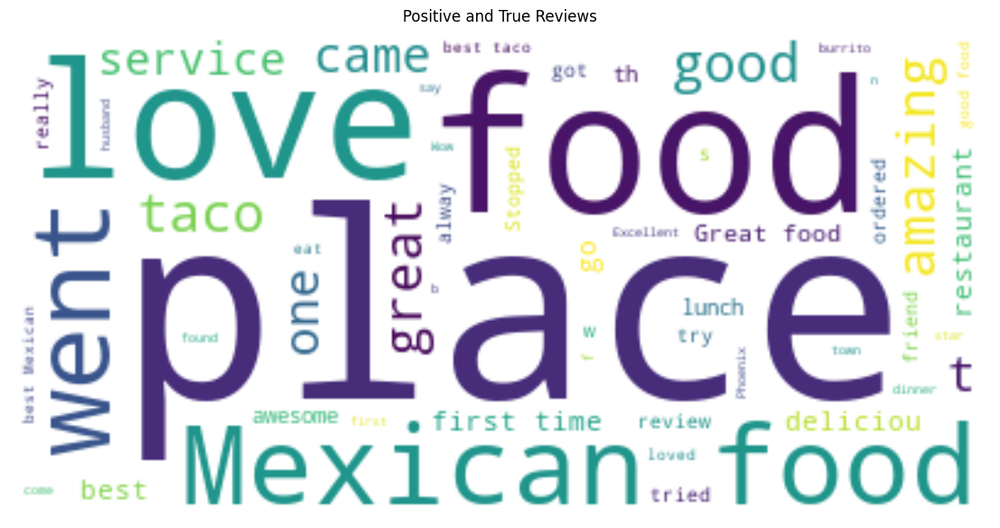

In [25]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS

# >= 4 star reviews:
# STOPWORDS - ones that we do not want to be part of our analysis
stopwords = set(STOPWORDS)
wc = WordCloud(max_words=100, stopwords=stopwords, margin=10, background_color="white").generate(text_reviews_4)

plt.figure(figsize=(14,12))
plt.title("Positive and True Reviews")
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

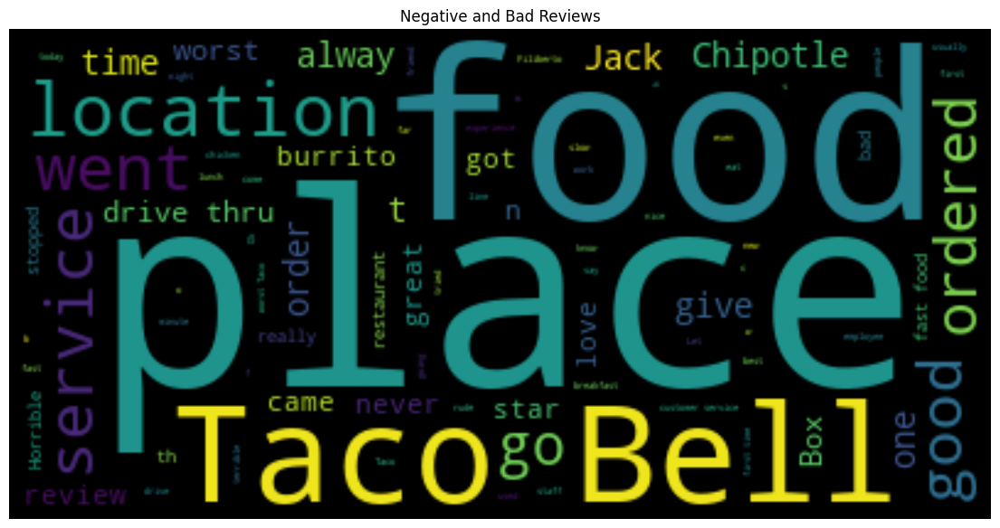

In [26]:
# <=2 star reviews:
# STOPWORDS - ones that we do not want to be part of our analysis
stopwords = set(STOPWORDS)
wc = WordCloud(max_words=100, stopwords=stopwords, margin=10, background_color="black").generate(text_reviews_2)

plt.figure(figsize=(14,12))
plt.title("Negative and Bad Reviews")
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

### 7d. Create n-grams for 4-star reviews (tri-grams)

In [27]:
# Create a counter for 5-star reviews
from nltk.corpus import stopwords
import nltk
nltk.download('punkt')

cachedStopWords = set(stopwords.words("english"))
tokens_4 = [w for w in nltk.word_tokenize(text_reviews_4.lower())
            if w.isalpha()]

no_stops_4 = [t for t in tokens_4
             if t not in cachedStopWords]


# Create a counter using lemmatizing for 4-star reviews¶
from nltk.stem import WordNetLemmatizer

wordnet_lemmatizer = WordNetLemmatizer()
# Create a variable named lemmatized_4 that lemmatizes the words in no_stops_4
lemmatized_4 = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_4]

# Create a counter for lemmatized_4 and name it text_bow_4.  
text_bow_4 = Counter(lemmatized_4)
text_chart_4 = pd.DataFrame(text_bow_4.most_common(20), columns = ['word', 'freq'])
text_chart_4

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\yingying.liu\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


,word,freq
0,place,28117
1,food,25683
2,great,18042
3,taco,17461
4,good,12725
5,mexican,10213
6,best,9794
7,love,9762
8,time,8209
9,service,8105


In [28]:
# Create a tri-gram version using lemmatized_4 and name it trigrams_lem_4
from nltk.util import ngrams
trigrams_lem_4 = ngrams(lemmatized_4, 3)
Counter(trigrams_lem_4).most_common(20)

[(('best', 'mexican', 'food'), 993),
 (('authentic', 'mexican', 'food'), 732),
 (('great', 'food', 'great'), 517),
 (('food', 'great', 'service'), 490),
 (('best', 'taco', 'ever'), 309),
 (('love', 'love', 'love'), 302),
 (('carne', 'asada', 'taco'), 298),
 (('good', 'mexican', 'food'), 279),
 (('favorite', 'mexican', 'restaurant'), 276),
 (('one', 'favorite', 'place'), 272),
 (('great', 'mexican', 'food'), 237),
 (('best', 'mexican', 'restaurant'), 227),
 (('place', 'great', 'food'), 226),
 (('love', 'place', 'food'), 224),
 (('food', 'good', 'service'), 223),
 (('went', 'first', 'time'), 220),
 (('mexican', 'food', 'ever'), 216),
 (('mexican', 'food', 'place'), 212),
 (('absolutely', 'love', 'place'), 210),
 (('service', 'great', 'food'), 204)]

## 7e. Create n-grams for 2-star reviews (tri-grams)

In [29]:
cachedStopWords = set(stopwords.words("english"))
tokens_2 = [w for w in nltk.word_tokenize(text_reviews_2.lower())
            if w.isalpha()]

no_stops_2 = [t for t in tokens_2
             if t not in cachedStopWords]


# Create a counter using lemmatizing for 2-star reviews
wordnet_lemmatizer = WordNetLemmatizer()
# Create a variable named lemmatized_2 that lemmatizes the words in no_stops_2
lemmatized_2 = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_2]

# Create a counter for lemmatized_2 and name it text_bow_2.  
text_bow_2 = Counter(lemmatized_2)
text_chart_2 = pd.DataFrame(text_bow_2.most_common(20), columns = ['word', 'freq'])
text_chart_2

,word,freq
0,food,835
1,taco,686
2,place,671
3,service,564
4,worst,456
5,bell,439
6,location,403
7,time,393
8,ever,341
9,went,339


In [30]:
# Create a tri-gram version using lemmatized_2 and name it trigrams_lem_2
from nltk.util import ngrams
trigrams_lem_2 = ngrams(lemmatized_2, 3)
Counter(trigrams_lem_2).most_common(20)

[(('worst', 'taco', 'bell'), 69),
 (('taco', 'bell', 'ever'), 44),
 (('worst', 'chipotle', 'ever'), 31),
 (('worst', 'jack', 'box'), 31),
 (('went', 'drive', 'thru'), 27),
 (('could', 'give', 'zero'), 26),
 (('give', 'zero', 'star'), 26),
 (('love', 'taco', 'bell'), 24),
 (('el', 'pollo', 'loco'), 22),
 (('worst', 'customer', 'service'), 22),
 (('jack', 'box', 'ever'), 20),
 (('wish', 'could', 'give'), 19),
 (('could', 'give', 'place'), 19),
 (('worst', 'service', 'ever'), 19),
 (('horrible', 'customer', 'service'), 18),
 (('zero', 'star', 'would'), 17),
 (('give', 'place', 'star'), 17),
 (('went', 'taco', 'bell'), 15),
 (('taco', 'bell', 'location'), 15),
 (('every', 'time', 'go'), 14)]

## 7f. Create a DataFrame for tri-grams for 4-star and 2-star

In [31]:
# Re-run the trigrams_lem_4 dataset.
wordnet_lemmatizer = WordNetLemmatizer()
# Create a variable named lemmatized_4 that lemmatizes the words in no_stops_4
lemmatized_4 = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_4]
text_bow_4 = Counter(lemmatized_4)

# Re-run the trigrams_lem_2 dataset.
wordnet_lemmatizer = WordNetLemmatizer()
# Create a variable named lemmatized_4 that lemmatizes the words in no_stops_4
lemmatized_2 = [wordnet_lemmatizer.lemmatize(t) for t in no_stops_2]

text_bow_2 = Counter(lemmatized_2)
df_trigram_2 = pd.DataFrame(text_bow_2, columns = ['word_2', 'freq_2'])

# Concatenate df_trigram_4 and df_trigram_2 and name it df_trigrams
df_trigram_4 = (pd.Series(nltk.ngrams(lemmatized_4, 3)).value_counts())
df_trigram_4 = pd.DataFrame(df_trigram_4).reset_index()
df_trigram_4.rename(columns={'index':'word_4', 'count':'freq_4'},inplace=True)

df_trigram_2 = (pd.Series(nltk.ngrams(lemmatized_2, 3)).value_counts())
df_trigram_2 = pd.DataFrame(df_trigram_2).reset_index()
df_trigram_2.rename(columns={'index':'word_2', 'count':'freq_2'},inplace=True)

df_trigrams = pd.concat((df_trigram_4, df_trigram_2), axis=1)
df_trigrams.head(10)

,word_4,freq_4,word_2,freq_2
0,"(best, mexican, food)",993,"(worst, taco, bell)",69.0
1,"(authentic, mexican, food)",732,"(taco, bell, ever)",44.0
2,"(great, food, great)",517,"(worst, jack, box)",31.0
3,"(food, great, service)",490,"(worst, chipotle, ever)",31.0
4,"(best, taco, ever)",309,"(went, drive, thru)",27.0
5,"(love, love, love)",302,"(give, zero, star)",26.0
6,"(carne, asada, taco)",298,"(could, give, zero)",26.0
7,"(good, mexican, food)",279,"(love, taco, bell)",24.0
8,"(favorite, mexican, restaurant)",276,"(worst, customer, service)",22.0
9,"(one, favorite, place)",272,"(el, pollo, loco)",22.0


### Section 7 Summary
We find top 15 business categories among all restaurants and selected one business category for further study. The table in section 7a shows there are 2,073 pizza restaurants, 1,805 Mexican restaurants, 1,664 Chinese restaurants in ‘Restaurants’ dataset. In here, we chose Mexican restaurants for further study. The complete dataset reveals a distribution of reviews with 120,511 rated at 5 stars, 68,225 at 4 stars, and 68,753 falling below 2 stars. Consequently, we have chosen to create text strings for reviews with ratings of 4 stars and above, as well as for those with ratings below or equal to 2 stars. Within section 7c, we generated two WordCloud figures, one for 4-star reviews and another for 2-star reviews. The WordCloud encompasses the top 100 words, highlighting positive sentiments in the 4-star reviews and capturing negative sentiments in the 2-star reviews. The table in section 7f. displays tri-grams extracted from reviews, along with their frequencies for both 4-star and 2-star ratings. This table summarizes frequently occurring tri-grams in positive (4-star) and negative (2-star) reviews, providing insights into common themes associated with each rating.

Tri-grams are useful for understanding common phrases or expressions used in reviews and can provide insights into the sentiments and themes associated with different ratings. In the context of Yelp or any review platform, such a table can be used for sentiment analysis and thematic analysis. The tri-grams associated with 4-star ratings (e.g., "best mexican food," "love love love") likely represent positive sentiments or aspects that customers appreciate. The tri-grams can provide insights into the specific aspects of the business that customers focus on when giving ratings. Conversely, the tri-grams associated with 2-star ratings (e.g., "worst taco bell," "worst jack box") may highlight negative sentiments or aspects that customers find disappointing. Understanding the prevalent tri-grams can help businesses identify strengths and weaknesses in different areas, allowing them to make informed decisions for improvement. Additionally, this information is valuable for customers seeking reviews to make decisions about where to dine or which businesses to choose. 

## Final Summary

There are many different use cases for the projects we worked on during this class. A cluster model is useful for identifying outlier groups.  This is often a crucial step in any data analysis as outlier groups can heavily skew your data.  We were able to identify that with the hierarchical and K-means clustering, there were heavily imbalanced clusters, with one cluster containing 99% of the population. Removing outliers is not always the best method, but it is sometimes necessary to make the data more representative of the population; after all, this data set is a sample of all Yelp reviews, not the entire population.

Next we looked at creating a recommender system based on Yelp reviews for restaurants.  Two different methods for building the recommender system were used, PCA and SVD, with both methods giving varying results.  We decided to focus on one restaurant category type, Mexican, to simply the recommender as most people would prefer recommendations based on a specific food type.  By randomly selecting one restaurant, we were able to develop a model that suggested either Lowkey Taco or Tequila Ranch depending on model preference.  While the Lowkey Taco did have a higher correlation to Taco Loco, Tequila Ranch also scored favorably.

Lastly, we built an NLP model based on 4+ star reviews and sub-2 star reviews to help customers identify what other customers like/dislike about a restaurant.  Utilizing a minimum of a tri-gram allows moe visibility into top words used to describe a restaurant in their review.  This is more helpful than using smaller n-grams as it gives more context around the words that are used.  I find the NLP especially helpful as it allows customers to better understand the key words used in a restaurant review without having to read through all of the reviews individually.  Another important feature of using NLP models, is it allows the business itself to better understand the common topics that are driving their reviews and adjust their business models accordingly.